(frailty_models)=
# Frailty and Survival Regression Models

:::{post} November, 2023
:tags: frailty models, survival analysis, competing risks
:category: intermediate, reference
:author: Nathaniel Forde
:::

:::{include} ../extra_installs.md
:::

In [1]:
import os

import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import pytensor.tensor as pt

from lifelines import KaplanMeierFitter
from matplotlib import cm
from scipy.stats import fisk, weibull_min

In [2]:
%config InlineBackend.figure_format = 'retina'  # high resolution figures
az.style.use("arviz-darkgrid")
rng = np.random.default_rng(42)

The full generality and range of application for survival analysis is masked by the loaded semantics of medical jargon. It is obscured by the persistent anxiety of self-concern amidst life tracked across calendars and milestones. But survival analysis broadly construed is not about you, it's not even necessarily about survival.  

It requires an extra step in abstraction to move from the medical context towards seeing that time-to-event data is everywhere! Every task which has an implicit clock, every goal with a finish line, every reaper owed a toll - these are sources of time-to-event data. 

We will demonstrate how the concepts of survival based regression analysis, traditionally deployed in the medical setting, can be fruitfully applied to HR data and business process analysis. In particular, we'll look at the question of time-to-attrition in employee life-cycle data and model this phenomena as a function of employee survey responses recorded earlier in the year. 

### Survival Regression Models

The emphasis here is on the generality of the framework. We are describing the trajectory of state-transitions within time. Anywhere speed or efficiency matters, it is important to understand the inputs to time-to-event trajectories. This is the benefit of survival analysis - clearly articulated models which quantify the impact of demographic characteristics and treatment effects (in terms of speed) on the probability of state-transition. Movement between life and death, hired and fired, ill and cured, subscribed to churned. These state transitions are all tranparently and compellingly modelled using survival regression models. 

We will see two varieties of regression modelling with respect to time-to-event data: (1) Cox's Proportional Hazard approach and (2) the Accelerated Failure time models. Both models enable the analyst to combine and assess the impacts of different covariates on the survival time outcomes, but each does so in a slightly different manner. 

We will also show a hierarchical variant of survival modelling called frailty modelling, where we estimate the survival function using regression but allow for the inclusion of individual or groups specific "frailty" terms. These are a multiplicative factor applied to the estimation routine of an individual's survival curve allowing us to capture some of the unexplained heterogeneity in the population. Additionally we will show how to express stratified approaches to estimating the baseline hazards. Throughout we will draw on the discussion in {cite:t}`collett2014survival`.

## Exploration of the Data

People Analytics is inherently about the understanding of efficiency and risk in business - survival analysis is uniquely suited to elucidating these dual concerns. Our example data is drawn from a HR themed case discussed in Keith McNulty's [Handbook of Regression Modelling in People Analytics](https://peopleanalytics-regression-book.org/survival.html) {cite:t}`mcknulty2020people`. 

The data describes survey responses to questions about job satisfaction and the respondents intention to seek employment elsewhere. Additionally the data has broad "demographic" information of the respondent and crucially indications of whether they `left` employment at the company and on which `month` after the survey we still have record of them at the company. We want to understand the probability of attrition over time as a function of the employee survey responses to help (a) manage the risk of being caught short-handed and (b) ensure efficiency through the maintenance of a suitably staffed company. 

It's important to note that this kind of data is invariably censored data, since it is always pulled at a point in time. So there are some people for whom which we do not see an exit event. They may never leave the company - but importantly at the point of measurement, we simply do not know if they will leave tomorrow... so the data is meaningfully censored at the point in time of measurement. Our modelling strategy needs to account for how that changes the probabilities in question as discussed in {ref}`GLM-truncated-censored-regression`.

In [3]:
try:
    retention_df = pd.read_csv(os.path.join("..", "data", "time_to_attrition.csv"))
except FileNotFoundError:
    retention_df = pd.read_csv(pm.get_data("time_to_attrition.csv"))


dummies = pd.concat(
    [
        pd.get_dummies(retention_df["gender"], drop_first=True),
        pd.get_dummies(retention_df["level"], drop_first=True),
        pd.get_dummies(retention_df["field"], drop_first=True),
    ],
    axis=1,
).rename({"M": "Male"}, axis=1)

retention_df = pd.concat([retention_df, dummies], axis=1).sort_values("Male")
retention_df.head()

,gender,field,level,sentiment,intention,left,month,Male,Low,Medium,Finance,Health,Law,Public/Government,Sales/Marketing
2997,F,Education and Training,Low,8,5,0,12,0,1,0,0,0,0,0,0
943,F,Education and Training,Medium,8,3,1,11,0,0,1,0,0,0,0,0
2548,F,Education and Training,Low,10,7,1,9,0,1,0,0,0,0,0,0
941,F,Education and Training,High,8,2,0,12,0,0,0,0,0,0,0,0
940,F,Education and Training,Low,8,8,0,12,0,1,0,0,0,0,0,0


We've added dummy-encoding of some of the categorical variables for use in regression models below. We drop the first encoded class because this avoids identification issues in the estimation procedure. Additionally this means that the coefficients estimated for each of these indicator variables have an interpretation relative to the dropped "reference" class.

First we'll look at a simple Kaplan Meier representation of the survival function estimated on our data. A survival function quantifies the probability that an event has not occurred before a given time i.e. the probability of employee attrition before a particular month. Naturally, different types of risk profile lead to different survival functions. Regression models, as is typical, help to parse the nature of that risk where the risk profile is too complicated to easily articulate. 

/Users/nathanielforde/mambaforge/envs/pymc_examples_new/lib/python3.9/site-packages/lifelines/plotting.py:964: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


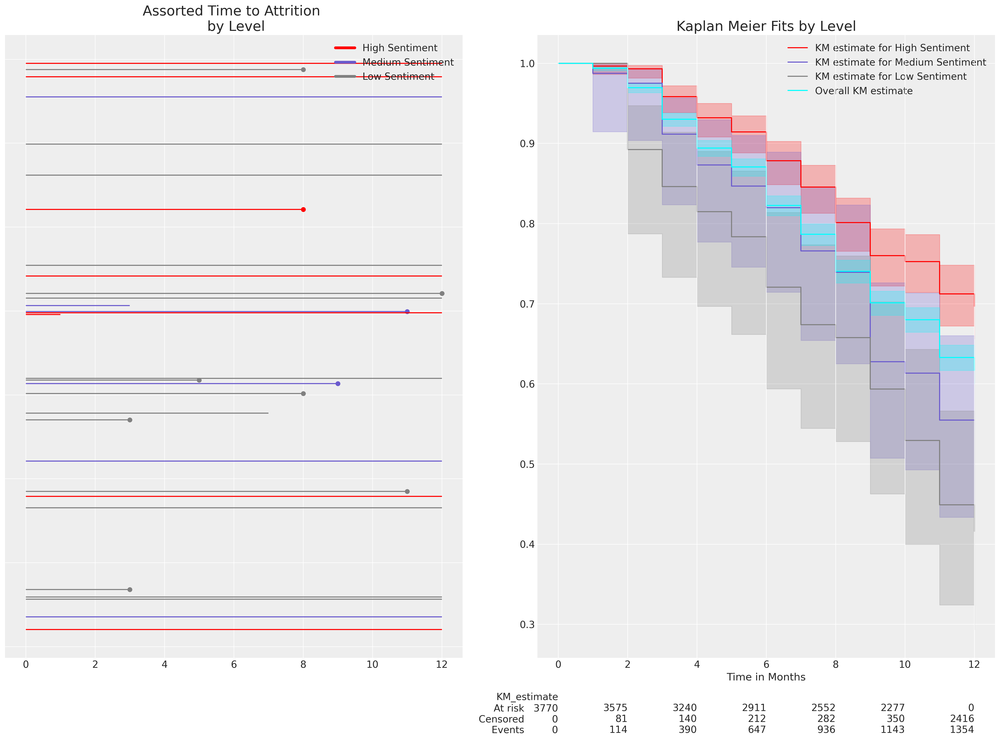

In [4]:
kmf = KaplanMeierFitter()
kmf.fit(retention_df["month"], event_observed=retention_df["left"])
kmf_hi = KaplanMeierFitter()
kmf_hi.fit(
    retention_df[retention_df["sentiment"] == 10]["month"],
    event_observed=retention_df[retention_df["sentiment"] == 10]["left"],
)
kmf_mid = KaplanMeierFitter()
kmf_mid.fit(
    retention_df[retention_df["sentiment"] == 5]["month"],
    event_observed=retention_df[retention_df["sentiment"] == 5]["left"],
)
kmf_low = KaplanMeierFitter()
kmf_low.fit(
    retention_df[retention_df["sentiment"] == 2]["month"],
    event_observed=retention_df[retention_df["sentiment"] == 2]["left"],
)

fig, axs = plt.subplots(1, 2, figsize=(20, 15))
axs = axs.flatten()
ax = axs[0]
for i in retention_df.sample(30).index[0:30]:
    temp = retention_df[retention_df.index == i]
    event = temp["left"].max() == 1
    level = temp["level"].unique()
    duration = temp["month"].max()
    color = np.where(level == "High", "red", np.where(level == "Medium", "slateblue", "grey"))
    ax.hlines(i, 0, duration, color=color)
    if event:
        ax.scatter(duration, i, color=color)
ax.set_title("Assorted Time to Attrition \n by Level", fontsize=20)
ax.set_yticklabels([])
from matplotlib.lines import Line2D

custom_lines = [
    Line2D([0], [0], color="red", lw=4),
    Line2D([0], [0], color="slateblue", lw=4),
    Line2D([0], [0], color="grey", lw=4),
]

ax.legend(custom_lines, ["High Sentiment", "Medium Sentiment", "Low Sentiment"])


kmf_hi.plot_survival_function(ax=axs[1], label="KM estimate for High Sentiment", color="red")
kmf_mid.plot_survival_function(
    ax=axs[1], label="KM estimate for Medium Sentiment", color="slateblue"
)
kmf_low.plot_survival_function(ax=axs[1], label="KM estimate for Low Sentiment", color="grey")
kmf.plot_survival_function(
    ax=axs[1], label="Overall KM estimate", color="cyan", at_risk_counts=True
)
axs[1].set_xlabel("Time in Months")
axs[1].set_title("Kaplan Meier Fits by Level", fontsize=20);

Here we've used the Kaplan Meier non-parametric estimate of the survival curve within levels of the `sentiment` variable to show how the anticipated levels of attrition over a 12 month period are modified by the levels of `sentiment` expressed by the participants at the outset of the trial period. This is just exploratory data analysis of the survival curves, but we want to understand how a probabilistic model can recover such survival curves and what are the appropriate interpretation of the probabilistic model. The lower the sentiment the faster attrition occurs. 

## Data Preperation for Survival Regression

The idea behind Cox Proportional Hazard regression models is, put crudely, to treat the temporal component of risk seriously. We imagine a latent baseline hazard of occurrence over the time-interval. Michael Betancourt [asks](https://betanalpha.github.io/assets/case_studies/survival_modeling.html) that we think of the hazard as "the accumulation of some stimulating resource" that precedes the occurrence of an event. In the context of a failure modelling it can be imagined as sporadic increasing wear and tear. In the context of HR dyanamics it could be imagined as increasing frustration is the work-environment. This term is often denoted:

$$ \lambda_{0}(t)$$

It is combined multiplicatively in the Cox Regression with a linear covariate representation of the individual case: 

$$ \lambda_{0}(t) \cdot exp(\beta_{1}X_{1} + \beta_{2}X_{2}... \beta_{k}X_{k}) $$

and represents the baseline hazard at each point in time when the predictor variables are set at their baseline/reference levels. Which is to say any unit increase over 0 to any covariate $X_{i}$ in the regression model changes the baseline hazard. In our case we are looking at data with granularity of monthly entries. So we need to understand how the risk of attrition changes over the next 12 months subsequent to the date of the annual survey and how the covariate profile of each individual changes the baseline hazard.

These models can be estimated using the approach of Bayesian estimation outlined by Austin Rochford in {ref}`survival_analysis`. In what follows we build on his examples. First we specify the temporal dimension of risk, in our case we have intervals of one month over a year - representing time since the date of the survey response. 



In [5]:
intervals = np.arange(12)
intervals

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11])

We then arrange our data into a structure to show if and when each individual in the data set experienced an event of attrition. The columns here are indicators for each month and the rows represent each individual in data set. The values show a 1 if the employee left the company in that month and a 0 otherwise. 

In [6]:
n_employees = retention_df.shape[0]
n_intervals = len(intervals)
last_period = np.floor((retention_df.month - 0.01) / 1).astype(int)
employees = np.arange(n_employees)
quit = np.zeros((n_employees, n_intervals))
quit[employees, last_period] = retention_df["left"]

pd.DataFrame(quit)

,0,1,2,3,4,5,6,7,8,9,10,11
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
3765,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3766,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3767,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3768,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


As outlined in {ref}`Reliability Statistics and Predictive Calibration` the hazard function, the cumulative density function and the survival function of a event time distribution are all intimately related. In particular each of these can be described in relation to the set of individuals at risk at any given time in the sequence. The pool of those individuals at risk changes over time as people experience events of attrition. This changes the conditional hazard over time - with knock on implications for the implied survival function. To account for this in our estimation strategy we need to configure our data to flag who is at risk and when. 

In [7]:
exposure = np.greater_equal.outer(retention_df.month.to_numpy(), intervals) * 1
exposure[employees, last_period] = retention_df.month - intervals[last_period]
pd.DataFrame(exposure)

,0,1,2,3,4,5,6,7,8,9,10,11
0,1,1,1,1,1,1,1,1,1,1,1,1
1,1,1,1,1,1,1,1,1,1,1,1,1
2,1,1,1,1,1,1,1,1,1,1,0,0
3,1,1,1,1,1,1,1,1,1,1,1,1
4,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3765,1,1,1,1,0,0,0,0,0,0,0,0
3766,1,1,1,1,1,1,1,1,0,0,0,0
3767,1,1,1,1,1,1,1,1,1,1,1,1
3768,1,1,1,1,1,1,1,1,1,1,1,1


A 0 in this data strucuture means the employee has already quit and no longer exists in the "at-risk" pool at that point in time. Whereas a 1 in this structure means the pool is in the risk pool and should be used to calculate the instantenous hazard at that interval. 

With these structures we are now in a position to estimate our model. Following Austin Rochford's example we again use the Poisson trick to estimate the Proportional hazard model. This might be somewhat surprising because the Cox Proportional Hazard model is normally advertised as a semi-parametric model which needs to be estimated using a partial likelihood due to the piecewise nature of the baseline hazard component. 

The trick is to see that Poisson regression for event counts and CoxPH regression are linked through the parameters which determine the event-rate. In the case of predicting counts we need a latent risk of a event indexed to time by an offset for each time-interval. This ensures that the likelihood term for a kind of Poisson regression is similar enough to the likelihood under consideration in the Cox Proportional Hazard regression that we can substitute one for the other. In other words the Cox Proportional hazard model can be estimated as GLM using a Poisson likelihood where we specify an "off-set" or intercept modification for each point on the time-interval: 

$$ CoxPH(left, month) \sim gender + level $$

is akin to 

$$ left \sim glm(gender + level + (1 | month)) \\ \text{ where link is } Poisson  $$

which we estimate using the structures defined above and PyMC as follows: 

## Fit Basic Cox Model with Fixed Effects

We'll set up a model factory function to fit the basic Cox proportional hazards model with different covariate specifications. We want to assess the differences in the model implications between a model that measures the intention to quit and one that does not. 

In [8]:
preds = [
    "sentiment",
    "Male",
    "Low",
    "Medium",
    "Finance",
    "Health",
    "Law",
    "Public/Government",
    "Sales/Marketing",
]
preds2 = [
    "sentiment",
    "intention",
    "Male",
    "Low",
    "Medium",
    "Finance",
    "Health",
    "Law",
    "Public/Government",
    "Sales/Marketing",
]


def make_coxph(preds):
    coords = {"intervals": intervals, "preds": preds, "individuals": range(len(retention_df))}

    with pm.Model(coords=coords) as base_model:
        X_data = pm.MutableData("X_data_obs", retention_df[preds], dims=("individuals", "preds"))
        lambda0 = pm.Gamma("lambda0", 0.01, 0.01, dims="intervals")

        beta = pm.Normal("beta", 0, sigma=1, dims="preds")
        lambda_ = pm.Deterministic(
            "lambda_",
            pt.outer(pt.exp(pm.math.dot(beta, X_data.T)), lambda0),
            dims=("individuals", "intervals"),
        )

        mu = pm.Deterministic("mu", exposure * lambda_, dims=("individuals", "intervals"))

        obs = pm.Poisson("obs", mu, observed=quit, dims=("individuals", "intervals"))
        base_idata = pm.sample(
            target_accept=0.95, random_seed=100, idata_kwargs={"log_likelihood": True}
        )

    return base_idata, base_model


base_idata, base_model = make_coxph(preds)
base_intention_idata, base_intention_model = make_coxph(preds2)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [lambda0, beta]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 60 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [lambda0, beta]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 69 seconds.


In [9]:
compare = az.compare({"sentiment": base_idata, "intention": base_intention_idata}, ic="waic")
compare

,rank,elpd_waic,p_waic,elpd_diff,weight,se,dse,warning,scale
intention,0,-5586.085248,21.327895,0.000000,0.996278,115.944586,0.000000,False,log
sentiment,1,-5680.561115,20.101640,94.475867,0.003722,117.596277,14.181559,False,log


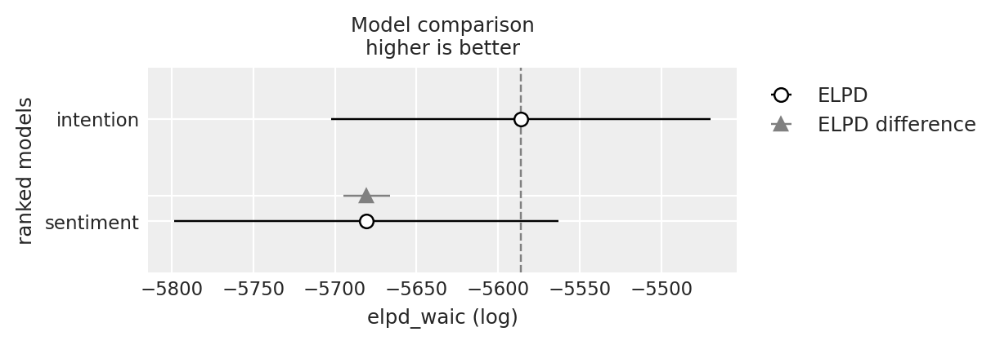

In [10]:
az.plot_compare(compare);

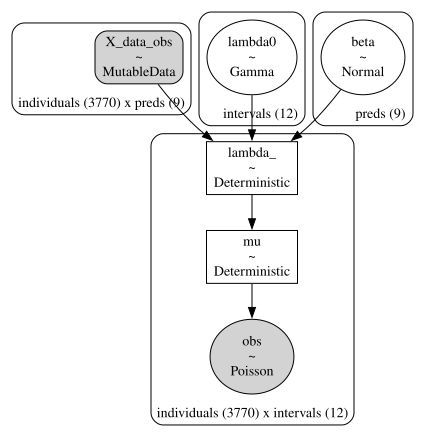

In [11]:
pm.model_to_graphviz(base_model)

We can see here how the structure of the model, while slightly different from a typical regression model, incorporates all the same elements. The observed variables are combined in a weighted sum that is fed forward to modify the outcome(s). In our case the outcomes are the hazards - or conditional risk at a specific point in time. It is this collection of estimates that serve as our view of the evolving nature of risk in the period. An obvious question then is how do the predictive variables contribute to the evolution of risk.

A secondary question is how does the instance by instance view of hazard translate into a view of the probability of survival over time? How can we move between the hazard based perspective to the survival base one?

### Interpreting the Model Coefficients

We'll focus first on the differential implications for the input variables in our two models. The beta parameter estimates are recorded on the scale of the log hazard rate. See first how the `intention` predictor (a score measuring the survey participant's intention to quit) shifts the magnitude and sign of the parameter estimates achieved in the model which failed to include this variable. This is a simple but poignant reminder to ensure that we measure the right thing, and that the features/variables which go into our model compose a story about the data generating process whether we pay attention or not. 

In [12]:
m = (
    az.summary(base_idata, var_names=["beta"])
    .reset_index()[["index", "mean"]]
    .rename({"mean": "expected_hr"}, axis=1)
)
m1 = (
    az.summary(base_intention_idata, var_names=["beta"])
    .reset_index()[["index", "mean"]]
    .rename({"mean": "expected_intention_hr"}, axis=1)
)
m = m.merge(m1, left_on="index", right_on="index", how="outer")
m["exp(expected_hr)"] = np.exp(m["expected_hr"])
m["exp(expected_intention_hr)"] = np.exp(m["expected_intention_hr"])
m

,index,expected_hr,expected_intention_hr,exp(expected_hr),exp(expected_intention_hr)
0,beta[sentiment],-0.110,-0.029,0.895834,0.971416
1,beta[Male],-0.037,0.015,0.963676,1.015113
2,beta[Low],0.137,0.155,1.146828,1.167658
3,beta[Medium],0.161,0.107,1.174685,1.112934
4,beta[Finance],0.207,0.234,1.229983,1.263644
5,beta[Health],0.249,0.236,1.282742,1.266174
6,beta[Law],0.091,0.073,1.095269,1.075731
7,beta[Public/Government],0.102,0.120,1.107383,1.127497
8,beta[Sales/Marketing],0.075,0.100,1.077884,1.105171
9,beta[intention],NaN,0.189,NaN,1.208041


Each individual model coefficient records an estimate of the impact on the log hazard ratio entailed by a unit increase in the input variable. Note how we have exponentiated the coefficients to return them to scale of the hazard ratio. For a predictor variable $X$ with coefficient $\beta$, the interpretation is as follows:

- If $exp(\beta)$ > 1: An increase in X is associated with an increased hazard (risk) of the event occurring.
- If $exp(\beta)$ < 1: An increase in X is associated with a decreased hazard (lower risk) of the event occurring.
- If $exp(\beta)$ = 1: X has no effect on the hazard rate.

So our case we can see that having an occupation in  the fields of Finance or Health would seem to induce a roughly 25% increase in the hazard risk of the event occuring over the baseline hazard. Interestingly we can see that the inclusion of the `intention` predictor seems to be important as a unit increase of the `intention` metric moves the dial similarly - and intention is a 0-10 scale. 

These are not time-varying - they enter __once__ into the weighted sum that modifies the baseline hazard. This is the proportional hazard assumption - that while the baseline hazard can change over time the difference in hazard induced by different levels in the covariates remains constant over time. The Cox model is popular because it allows us to estimate a changing hazard at each time-point and incorporates the impact of the demographic predictors multiplicatively across the period. The proportional hazards assumption does not always hold, and we'll see some adjustments below that can help deal with violations of the proportional hazards assumption. 

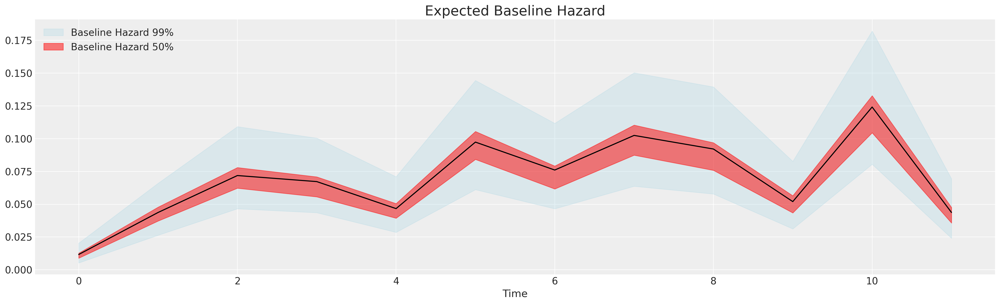

In [13]:
fig, ax = plt.subplots(figsize=(20, 6))
ax.plot(base_idata["posterior"]["lambda0"].mean(("draw", "chain")), color="black")
az.plot_hdi(
    range(12),
    base_idata["posterior"]["lambda0"],
    color="lightblue",
    ax=ax,
    hdi_prob=0.99,
    fill_kwargs={"label": "Baseline Hazard 99%", "alpha": 0.3},
    smooth=False,
)
az.plot_hdi(
    range(12),
    base_idata["posterior"]["lambda0"],
    color="red",
    ax=ax,
    hdi_prob=0.50,
    fill_kwargs={"label": "Baseline Hazard 50%"},
    smooth=False,
)
ax.legend()
ax.set_xlabel("Time")
ax.set_title("Expected Baseline Hazard", fontsize=20);

This is the baseline stimulus - the growing, sporadically shifting hazard that spurs the occurrence of attrition. We build regression models incorporating a slew of control variables and treatment indicators to evaluate what if any effect they have on changing the baseline hazard over time. Survival regression modelling is a transparent tool for analysing the impact of demographic and behavioural features of risk over time. Note the sharp increase at the end of an annual cycle.

### Predicting Marginal Effects of CoxPH regression

We can make these interpretations a little more concrete by deriving the marginal effects on sample/fictional data. Now we define the relationship between the survival and cumulative hazard measures as a function of the baseline hazard. 

In [14]:
def cum_hazard(hazard):
    return hazard.cumsum(dim="intervals")


def survival(hazard):
    return np.exp(-cum_hazard(hazard))


def get_mean(trace):
    return trace.mean(("draw", "chain"))

The cumulative hazard smoothes out the jumpy nature of the base hazard function, giving us a cleaner picture of the degree of increased risk over time. This is (in turn) translated into our survival function, which nicely expresses the risk on the 0-1 scale. Next we set up a function to derive the survival and cumulative hazard functions for each individual conditional of their risk profile. 

In [15]:
def extract_individual_hazard(idata, i, retention_df, intention=False):
    beta = idata.posterior["beta"]
    if intention:
        intention_posterior = beta.sel(preds="intention")
    else:
        intention_posterior = 0
    hazard_base_m1 = idata["posterior"]["lambda0"]

    full_hazard_idata = hazard_base_m1 * np.exp(
        beta.sel(preds="sentiment") * retention_df.iloc[i]["sentiment"]
        + np.where(intention, intention_posterior * retention_df.iloc[i]["intention"], 0)
        + beta.sel(preds="Male") * retention_df.iloc[i]["Male"]
        + beta.sel(preds="Low") * retention_df.iloc[i]["Low"]
        + beta.sel(preds="Medium") * retention_df.iloc[i]["Medium"]
        + beta.sel(preds="Finance") * retention_df.iloc[i]["Finance"]
        + beta.sel(preds="Health") * retention_df.iloc[i]["Health"]
        + beta.sel(preds="Law") * retention_df.iloc[i]["Law"]
        + beta.sel(preds="Public/Government") * retention_df.iloc[i]["Public/Government"]
        + beta.sel(preds="Sales/Marketing") * retention_df.iloc[i]["Sales/Marketing"]
    )

    cum_haz_idata = cum_hazard(full_hazard_idata)
    survival_idata = survival(full_hazard_idata)
    return full_hazard_idata, cum_haz_idata, survival_idata, hazard_base_m1


def plot_individuals(retention_df, idata, individuals=[1, 300, 700], intention=False):
    fig, axs = plt.subplots(1, 2, figsize=(20, 7))
    axs = axs.flatten()
    colors = ["slateblue", "magenta", "darkgreen"]
    for i, c in zip(individuals, colors):
        haz_idata, cum_haz_idata, survival_idata, base_hazard = extract_individual_hazard(
            idata, i, retention_df, intention
        )
        axs[0].plot(get_mean(survival_idata), label=f"individual_{i}", color=c)
        az.plot_hdi(range(12), survival_idata, ax=axs[0], fill_kwargs={"color": c})
        axs[1].plot(get_mean(cum_haz_idata), label=f"individual_{i}", color=c)
        az.plot_hdi(range(12), cum_haz_idata, ax=axs[1], fill_kwargs={"color": c})
        axs[0].set_title("Individual Survival Functions", fontsize=20)
        axs[1].set_title("Individual Cumulative Hazard Functions", fontsize=20)
    az.plot_hdi(
        range(12),
        survival(base_hazard),
        color="lightblue",
        ax=axs[0],
        fill_kwargs={"label": "Baseline Survival"},
    )
    axs[0].plot(
        get_mean(survival(base_hazard)),
        color="black",
        linestyle="--",
        label="Expected Baseline Survival",
    )
    az.plot_hdi(
        range(12),
        cum_hazard(base_hazard),
        color="lightblue",
        ax=axs[1],
        fill_kwargs={"label": "Baseline Hazard"},
    )
    axs[1].plot(
        get_mean(cum_hazard(base_hazard)),
        color="black",
        linestyle="--",
        label="Expected Baseline Hazard",
    )
    axs[0].legend()
    axs[0].set_ylabel("Probability of Survival")
    axs[1].set_ylabel("Cumulative Hazard Risk")
    axs[0].set_xlabel("Time")
    axs[1].set_xlabel("Time")
    axs[1].legend()


#### Next set up test-data input to explore the relationship between levels of the variables.
test_df = pd.DataFrame(np.zeros((3, 15)), columns=retention_df.columns)
test_df["sentiment"] = [1, 5, 10]
test_df["intention"] = [1, 5, 10]
test_df["Medium"] = [0, 0, 0]
test_df["Finance"] = [0, 0, 0]
test_df["M"] = [1, 1, 1]
test_df

,gender,field,level,sentiment,intention,left,month,Male,Low,Medium,Finance,Health,Law,Public/Government,Sales/Marketing,M
0,0.0,0.0,0.0,1,1,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,1
1,0.0,0.0,0.0,5,5,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,1
2,0.0,0.0,0.0,10,10,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,1


### The Intention Model

If we plot the marginal effects due to increases in the `intention` variable - in the model equipped to evaluate it, we see a sharp division in the individual predicted survival curves as implied by the significant and substantial parameter estimate seen in the coefficient table above for the `intention` variable.

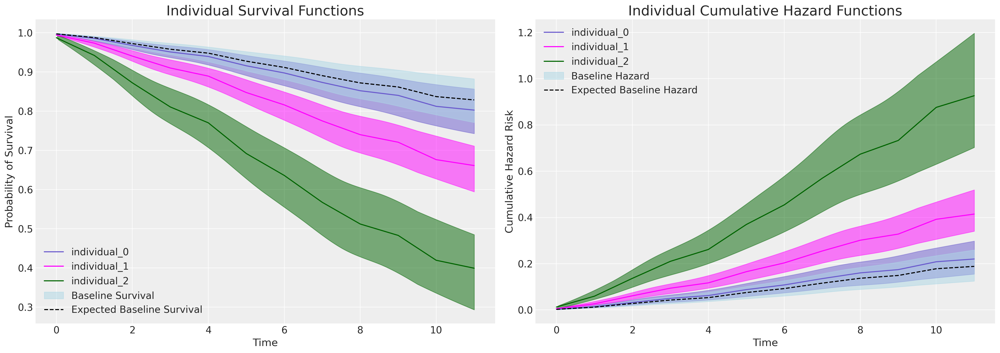

In [16]:
plot_individuals(test_df, base_intention_idata, [0, 1, 2], intention=True)

Focus here on the plot on the right. The baseline cumulative hazard is represented in blue, where each subsequent curve represents the cumulative hazard for individuals with increasing scores on the `intention` metric i.e. with increased hazard. This pattern is inverted on the plot on the left - where instead we see how probability of survival decreases over time more sharply for those individuals which high `intention` values.

### The Sentiment Model

If we submit the same test to a model unable to account for intention most of the weight falls on the differences specified between the sentiment recorded by the survey participant. Here we also see a seperation in the survival curves, but the effect is much less pronounced. 

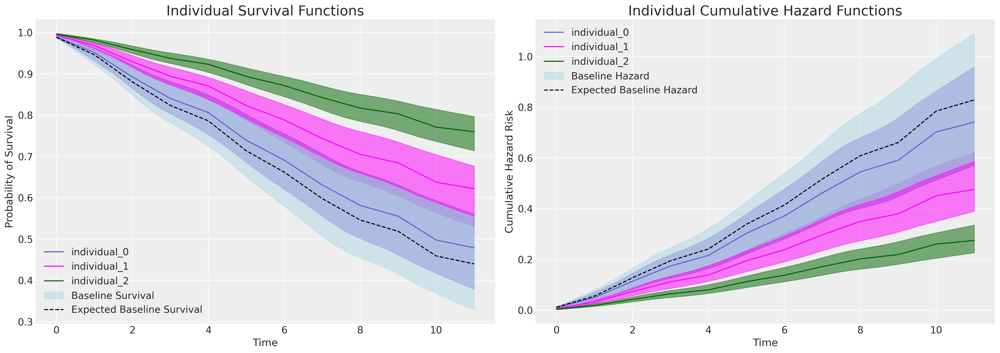

In [17]:
plot_individuals(test_df, base_idata, [0, 1, 2], intention=False)

One major observation to note here is how much work is done by the baseline hazard in each model. In the model which can account for the influence of the `intention` metric the baseline hazard is lower. Suggesting the baseline hazard has to do more work. Other combinations of test-data and input specifications can be used to experiment with the conditional implications of the CoxPh model in this way. 

### Make Predictions for Individual Characteristics

It's all well and good to use marginal effects analysis to better understand the impact of particular variables, but how can we use it to predict the likely trajectories within our pool of polled employees? Here we simply re-apply the model to our observed data set where each participant is characterised in some sense by the observable inputs of our model. 

We can use these characteristics to predict the survival curves of our current or future employee base and make interventions where necessary to mitigate the implied risk of attrition for these and similar employee risk profiles.  


In [18]:
def create_predictions(retention_df, idata, intention=False):
    cum_haz = {}
    surv = {}
    for i in range(len(retention_df)):
        haz_idata, cum_haz_idata, survival_idata, base_hazard = extract_individual_hazard(
            idata, i, retention_df, intention=intention
        )
        cum_haz[i] = get_mean(cum_haz_idata)
        surv[i] = get_mean(survival_idata)
    cum_haz = pd.DataFrame(cum_haz)
    surv = pd.DataFrame(surv)
    return cum_haz, surv


cum_haz_df, surv_df = create_predictions(retention_df, base_idata, intention=False)
surv_df

,0,1,2,3,4,5,6,7,8,9,...,3760,3761,3762,3763,3764,3765,3766,3767,3768,3769
0,0.994518,0.994380,0.995593,0.995206,0.994518,0.994583,0.994518,0.990579,0.992487,0.992931,...,0.992586,0.993310,0.988610,0.995757,0.995011,0.992717,0.993964,0.993364,0.993472,0.994148
1,0.974209,0.973561,0.979227,0.977416,0.974209,0.974516,0.974209,0.956012,0.964789,0.966834,...,0.965227,0.968581,0.946990,0.979984,0.976493,0.965843,0.971611,0.968831,0.969341,0.972481
2,0.941695,0.940254,0.952883,0.948839,0.941695,0.942373,0.941695,0.901768,0.920887,0.925422,...,0.921831,0.929225,0.882325,0.954570,0.946789,0.923202,0.935920,0.929808,0.930906,0.937853
3,0.912256,0.910122,0.928877,0.922866,0.912256,0.913260,0.912256,0.853823,0.881618,0.888305,...,0.883002,0.893866,0.825868,0.931396,0.919829,0.885028,0.903721,0.894759,0.896340,0.906584
4,0.892383,0.889804,0.912586,0.905277,0.892383,0.893598,0.892383,0.822082,0.855371,0.863449,...,0.857049,0.870148,0.788869,0.915657,0.901596,0.859485,0.882054,0.871244,0.873125,0.885513
5,0.852282,0.848839,0.879493,0.869634,0.852282,0.853915,0.852282,0.759607,0.803079,0.813822,...,0.805304,0.822650,0.716938,0.883650,0.864693,0.808524,0.838480,0.824164,0.826588,0.843096
6,0.822221,0.818154,0.854484,0.842780,0.822221,0.824154,0.822221,0.714154,0.764475,0.777070,...,0.767064,0.787359,0.665387,0.859430,0.836926,0.770838,0.805941,0.789185,0.791977,0.811387
7,0.783397,0.778581,0.821918,0.807920,0.783397,0.785703,0.783397,0.657223,0.715395,0.730204,...,0.718425,0.742221,0.601809,0.827853,0.800941,0.722843,0.764111,0.744436,0.747639,0.770556
8,0.750084,0.744669,0.793722,0.777839,0.750084,0.752690,0.750084,0.609981,0.673991,0.690544,...,0.677365,0.703892,0.549930,0.800474,0.769951,0.682285,0.728390,0.706434,0.709932,0.735632
9,0.731908,0.726186,0.778234,0.761359,0.731908,0.734672,0.731908,0.584842,0.651689,0.669128,...,0.655238,0.683145,0.522666,0.785421,0.752995,0.660411,0.708973,0.685863,0.689499,0.716627


### Sample Survival Curves and their Marginal Expected Survival Trajectory.

We now plot these individual risk profiles and marginalise across the predicted survival curves.

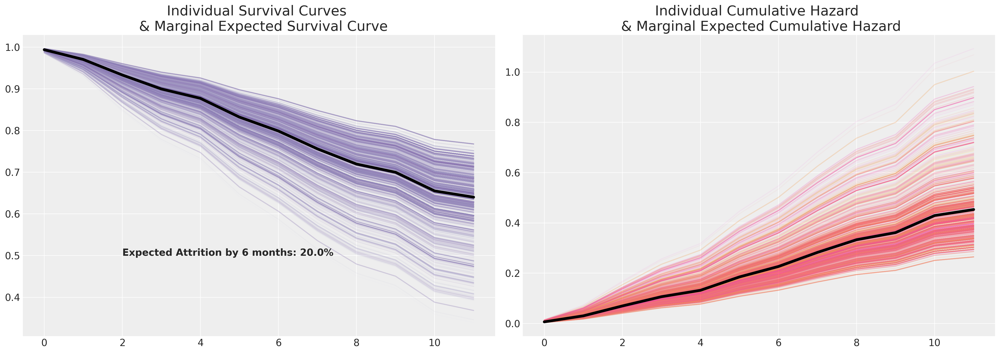

In [19]:
cm_subsection = np.linspace(0, 1, 120)
colors_m = [cm.Purples(x) for x in cm_subsection]
colors = [cm.spring(x) for x in cm_subsection]


fig, axs = plt.subplots(1, 2, figsize=(20, 7))
axs = axs.flatten()
cum_haz_df.plot(legend=False, color=colors, alpha=0.05, ax=axs[1])
axs[1].plot(cum_haz_df.mean(axis=1), color="black", linewidth=4)
axs[1].set_title(
    "Individual Cumulative Hazard \n & Marginal Expected Cumulative Hazard", fontsize=20
)

surv_df.plot(legend=False, color=colors_m, alpha=0.05, ax=axs[0])
axs[0].plot(surv_df.mean(axis=1), color="black", linewidth=4)
axs[0].set_title("Individual Survival Curves \n  & Marginal Expected Survival Curve", fontsize=20)
axs[0].annotate(
    f"Expected Attrition by 6 months: {100*np.round(1-surv_df.mean(axis=1).iloc[6], 2)}%",
    (2, 0.5),
    fontsize=14,
    fontweight="bold",
);

The marginal survival curve here is a summary statistic just like measuring the average in simpler cases. It is characteristic of your sample data (the individuals in your sample), and as such you should only take it as an indicative or generalisable measure in so far as you're happy to say that your sample data is proportionally representative of the different characteristic features of risk in your population. Survival __modelling__ is not a substitute for sound experimental design, but it can be used to analyse experimental data.

In the HR context we might be interested in the time-to-attrition metrics under the impact of a management training programme, or lead time to production code in the context of a software development team when adopting agile practices or new tooling. Understanding policies that effect efficiency is good, understanding the rate at which policies effect efficiency is better.  

## Accelerated Failure Time Models

Next we examine a parametric family of regression based survival models called accelerated failure time models (AFTs). These are regression models that seek to describe the survival function of interest with appeal to one or other of the canonical statistical distributions that can be neatly characterised with a set of location and scale parameters e.g. the Weilbull distribution, the Log-Logistic distribution and the LogNormal distribution to name a few. One advantage of these family of distributions is that we have access to more flexible hazard functions without having to explicitly parameterise the time-interval. 

See here for example how the log-logistic distribution exhibits a non-monotonic hazard function whereas the Weibull hazard is necessarily monotonic. This is an important observation if your theory of the case allows for rising and falling risks of event occurrence.


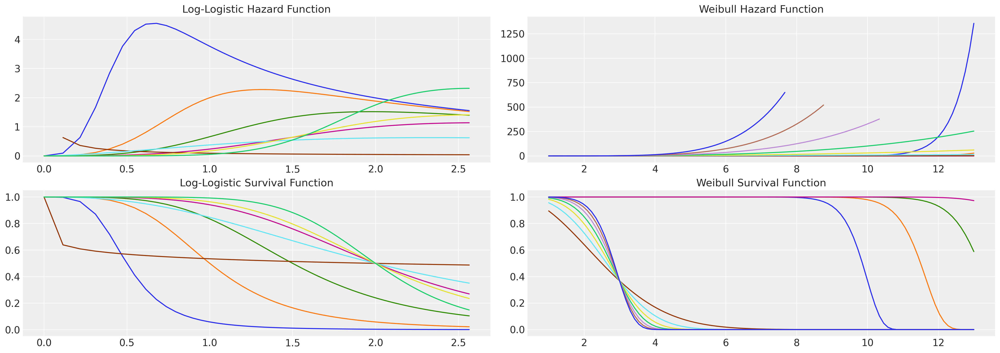

In [20]:
fig, axs = plt.subplots(2, 2, figsize=(20, 7))
axs = axs.flatten()


def make_loglog_haz(alpha, beta):
    ## This is the Log Logistic distribution
    dist = fisk(c=alpha, scale=beta)
    t = np.log(np.linspace(1, 13, 100))  # Time values
    pdf_values = dist.pdf(t)
    sf_values = dist.sf(t)
    haz_values = pdf_values / sf_values
    axs[0].plot(t, haz_values)
    axs[2].plot(t, sf_values)


def make_weibull_haz(alpha, beta):
    dist = weibull_min(c=alpha, scale=beta)
    t = np.linspace(1, 13, 100)  # Time values
    pdf_values = dist.pdf(t)
    sf_values = dist.sf(t)
    haz_values = pdf_values / sf_values
    axs[1].plot(t, haz_values)
    axs[3].plot(t, sf_values)


[make_loglog_haz(4, b) for b in np.linspace(0.5, 2, 4)]
[make_loglog_haz(a, 2) for a in np.linspace(0.2, 7, 4)]
[make_weibull_haz(25, b) for b in np.linspace(10, 15, 4)]
[make_weibull_haz(a, 3) for a in np.linspace(2, 7, 7)]
axs[0].set_title("Log-Logistic Hazard Function", fontsize=15)
axs[2].set_title("Log-Logistic Survival Function", fontsize=15)
axs[1].set_title("Weibull Hazard Function", fontsize=15)
axs[3].set_title("Weibull Survival Function", fontsize=15);

AFT models incorporate the explanatory variables in a regression model so that they act multiplicatively on the time scale effecting the rate at which an individual proceeds along the time axis. As such the model can be interpreted directly as parameterised by the speed of progression towards the event of interest. The Survival function of AFT models are generally specified as: 

$$ S_{i}(t) = S_{0}\Bigg(\frac{t}{exp(\alpha_{i}x_{i} + \alpha_{2}x_{2} ... \alpha_{p}x_{p})} \Bigg) $$

where $S_{0}$ is the baseline survival, but the model is often represented in log-linear form: 

$$ log (T_{i}) = \mu + \alpha_{i}x_{i} + \alpha_{2}x_{2} ... \alpha_{p}x_{p} + \sigma\epsilon_{i} $$

where we have the baseline survival function $S_{0} = P(exp(\mu + \sigma\epsilon_{i}) \geq t)$ modified by additional covariates. The details are largely important for the estimation strategies, but they show how the impact of risk can be decomposed here just as in the CoxPH model. The effects of the covariates are additive on the log-scale towards the acceleration factor induced by the individual's risk profile.

Below we'll estimate two AFT models: the weibull model and the Log-Logistic model. Ultimately we're just fitting a censored parametric distribution but we've allowed that that one of the parameters of each distribution is specified as a linear function of the explainatory variables. So the log likelihood term is just: 

$$ log(L) = \sum_{i}^{n} \Big[ c_{i}log(f(t)) + (1-c_{i})log(S(t))) \Big]  $$ 

where $f$ is the distribution pdf function , $S$ is the survival fucntion and $c$ is an indicator function for whether the observation is censored - meaning it takes a value in $\{0, 1\}$ depending on whether the individual is censored. Both $f$, $S$ are parameterised by some vector of parameters $\mathbf{\theta}$.  In the case of the Log-Logistic model we estimate it by transforming our time variable to a log-scale and fitting a logistic likelihood with parameters $\mu, s$. The resulting parameter fits can be adapted to recover the log-logistic survival function as we'll show below. In the case of the Weibull model the parameters are denote $\alpha, \beta$ respectively.

In [21]:
coords = {
    "intervals": intervals,
    "preds": [
        "sentiment",
        "intention",
        "Male",
        "Low",
        "Medium",
        "Finance",
        "Health",
        "Law",
        "Public/Government",
        "Sales/Marketing",
    ],
}

X = retention_df[
    [
        "sentiment",
        "intention",
        "Male",
        "Low",
        "Medium",
        "Finance",
        "Health",
        "Law",
        "Public/Government",
        "Sales/Marketing",
    ]
].copy()
y = retention_df["month"].values
cens = retention_df.left.values == 0.0


def logistic_sf(y, μ, s):
    return 1.0 - pm.math.sigmoid((y - μ) / s)


def weibull_lccdf(x, alpha, beta):
    """Log complementary cdf of Weibull distribution."""
    return -((x / beta) ** alpha)


def make_aft(y, weibull=True):
    with pm.Model(coords=coords, check_bounds=False) as aft_model:
        X_data = pm.MutableData("X_data_obs", X)
        beta = pm.Normal("beta", 0.0, 1, dims="preds")
        mu = pm.Normal("mu", 0, 1)

        if weibull:
            s = pm.HalfNormal("s", 5.0)
            eta = pm.Deterministic("eta", pm.math.dot(beta, X_data.T))
            reg = pm.Deterministic("reg", pt.exp(-(mu + eta) / s))
            y_obs = pm.Weibull("y_obs", beta=reg[~cens], alpha=s, observed=y[~cens])
            y_cens = pm.Potential("y_cens", weibull_lccdf(y[cens], alpha=s, beta=reg[cens]))
        else:
            s = pm.HalfNormal("s", 5.0)
            eta = pm.Deterministic("eta", pm.math.dot(beta, X_data.T))
            reg = pm.Deterministic("reg", mu + eta)
            y_obs = pm.Logistic("y_obs", mu=reg[~cens], s=s, observed=y[~cens])
            y_cens = pm.Potential("y_cens", logistic_sf(y[cens], reg[cens], s=s))

        idata = pm.sample_prior_predictive()
        idata.extend(
            pm.sample(target_accept=0.95, random_seed=100, idata_kwargs={"log_likelihood": True})
        )
        idata.extend(pm.sample_posterior_predictive(idata))
    return idata, aft_model


weibull_idata, weibull_aft = make_aft(y)
## Log y to ensure we're estimating a log-logistic random variable
loglogistic_idata, loglogistic_aft = make_aft(np.log(y), weibull=False)

/var/folders/__/ng_3_9pn1f11ftyml_qr69vh0000gn/T/ipykernel_42261/3743381411.py:63: UserWarning: The effect of Potentials on other parameters is ignored during prior predictive sampling. This is likely to lead to invalid or biased predictive samples.
  idata = pm.sample_prior_predictive()
Sampling: [beta, mu, s, y_obs]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [beta, mu, s]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 88 seconds.
/var/folders/__/ng_3_9pn1f11ftyml_qr69vh0000gn/T/ipykernel_42261/3743381411.py:67: UserWarning: The effect of Potentials on other parameters is ignored during posterior predictive sampling. This is likely to lead to invalid or biased predictive samples.
  idata.extend(pm.sample_posterior_predictive(idata))
Sampling: [y_obs]


/var/folders/__/ng_3_9pn1f11ftyml_qr69vh0000gn/T/ipykernel_42261/3743381411.py:63: UserWarning: The effect of Potentials on other parameters is ignored during prior predictive sampling. This is likely to lead to invalid or biased predictive samples.
  idata = pm.sample_prior_predictive()
Sampling: [beta, mu, s, y_obs]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [beta, mu, s]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 63 seconds.
/var/folders/__/ng_3_9pn1f11ftyml_qr69vh0000gn/T/ipykernel_42261/3743381411.py:67: UserWarning: The effect of Potentials on other parameters is ignored during posterior predictive sampling. This is likely to lead to invalid or biased predictive samples.
  idata.extend(pm.sample_posterior_predictive(idata))
Sampling: [y_obs]


In [22]:
compare = az.compare({"weibull": weibull_idata, "loglogistic": loglogistic_idata}, ic="waic")
compare

,rank,elpd_waic,p_waic,elpd_diff,weight,se,dse,warning,scale
loglogistic,0,-1529.708134,12.302538,0.000000,1.0,28.919768,0.000000,False,log
weibull,1,-4449.052088,7.357847,2919.343954,0.0,14.245419,20.929315,False,log


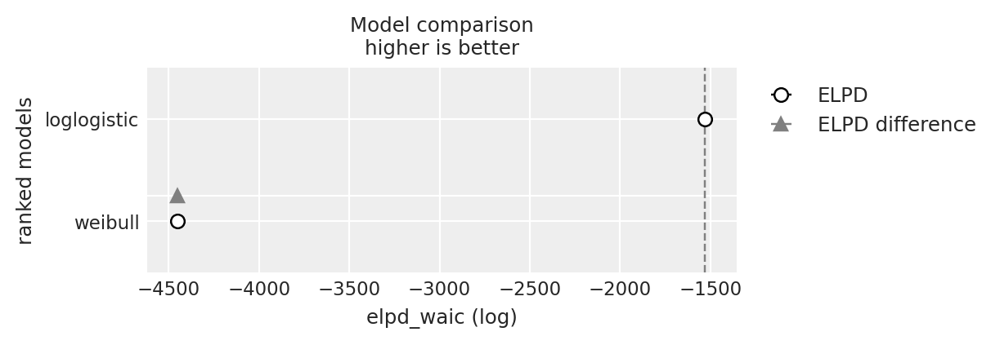

In [23]:
az.plot_compare(compare);

### Deriving Individual Survival Predictions from AFT models

From above we can see how the regression equation is calculated and enters into the Weibull likelihood as the $\beta$ term and the logistic distribution as the $\mu$ parameter. In both cases the $s$ parameter remains free to determine the shape of the distribution. Recall from above that the regression equation enters into the survival function as a denominator for the sequence of time-points $t$

$$ S_{i}(t) = S_{0}\Bigg(\frac{t}{exp(\alpha_{i}x_{i} + \alpha_{2}x_{2} ... \alpha_{p}x_{p})}\Bigg) $$

So the smaller the weighted sum the greater the **acceleration factor** induced by the individual's risk profile. 

### Weibull

The estimated parameters fit for each individual case can be directly fed into the Weibull survival function as the $\beta$ term to recover the predicted trajectories. 



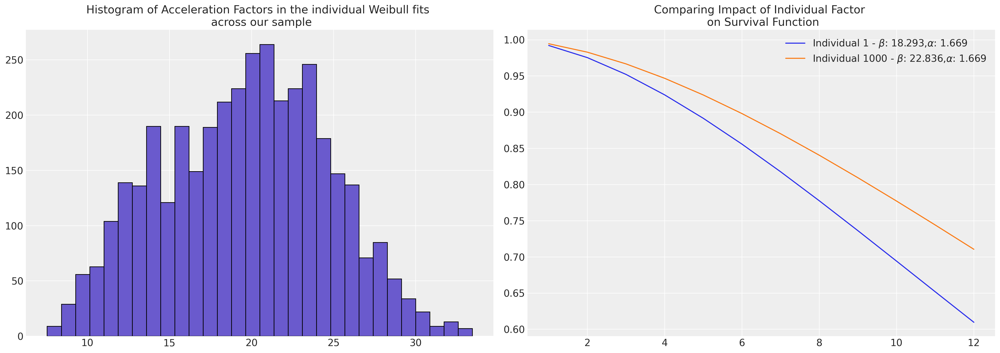

In [24]:
fig, axs = plt.subplots(1, 2, figsize=(20, 7))
axs = axs.flatten()
#### Using the fact that we've already stored expected value for the regression equation
reg = az.summary(weibull_idata, var_names=["reg"])["mean"]
t = np.arange(1, 13, 1)
s = az.summary(weibull_idata, var_names=["s"])["mean"][0]
axs[0].hist(reg, bins=30, ec="black", color="slateblue")
axs[0].set_title(
    "Histogram of Acceleration Factors in the individual Weibull fits \n across our sample"
)
axs[1].plot(
    t,
    weibull_min.sf(t, s, scale=reg.iloc[0]),
    label=r"Individual 1 - $\beta$: " + f"{reg.iloc[0]}," + r"$\alpha$: " + f"{s}",
)
axs[1].plot(
    t,
    weibull_min.sf(t, s, scale=reg.iloc[1000]),
    label=r"Individual 1000 - $\beta$: " + f"{reg.iloc[1000]}," + r"$\alpha$: " + f"{s}",
)
axs[1].set_title("Comparing Impact of Individual Factor \n on Survival Function")
axs[1].legend();

In [25]:
diff = reg.iloc[1000] - reg.iloc[0]
pchange = np.round(100 * (diff / reg.iloc[1000]), 2)
print(
    f"In this case we could think of the relative change in acceleration \n factor between the individuals as representing a {pchange}% increase"
)

In this case we could think of the relative change in acceleration 
 factor between the individuals as representing a 19.89% increase


In [26]:
reg = az.summary(weibull_idata, var_names=["reg"])["mean"]
s = az.summary(weibull_idata, var_names=["s"])["mean"][0]
t = np.arange(1, 13, 1)
weibull_predicted_surv = pd.DataFrame(
    [weibull_min.sf(t, s, scale=reg.iloc[i]) for i in range(len(reg))]
).T

weibull_predicted_surv

,0,1,2,3,4,5,6,7,8,9,...,3760,3761,3762,3763,3764,3765,3766,3767,3768,3769
0,0.992210,0.995004,0.989394,0.996205,0.985931,0.986630,0.993607,0.991524,0.984801,0.988076,...,0.992000,0.992905,0.977054,0.994145,0.994967,0.992228,0.995732,0.992615,0.992552,0.994143
1,0.975437,0.984199,0.966660,0.987982,0.955944,0.958101,0.979811,0.973296,0.952463,0.962572,...,0.974782,0.977613,0.928841,0.981499,0.984083,0.975495,0.986491,0.976704,0.976508,0.981495
2,0.952249,0.969150,0.935465,0.976494,0.915172,0.919238,0.960668,0.948141,0.908627,0.927698,...,0.950991,0.956432,0.864823,0.963927,0.968926,0.952360,0.973597,0.954684,0.954306,0.963919
3,0.923963,0.950613,0.897784,0.962283,0.866516,0.872748,0.937201,0.917528,0.856522,0.885767,...,0.921990,0.930531,0.790779,0.942347,0.950258,0.924136,0.957673,0.927784,0.927191,0.942334
4,0.891571,0.929133,0.855147,0.945732,0.812266,0.820757,0.910170,0.882575,0.798705,0.838585,...,0.888810,0.900784,0.711300,0.917431,0.928629,0.891814,0.939163,0.896928,0.896095,0.917413
5,0.855910,0.905157,0.808853,0.927149,0.754364,0.765074,0.880204,0.844222,0.737341,0.787690,...,0.852318,0.867922,0.630133,0.889738,0.904492,0.856226,0.918430,0.862888,0.861802,0.889714
6,0.817716,0.879077,0.760043,0.906799,0.694484,0.707264,0.847860,0.803302,0.674283,0.734421,...,0.813280,0.832589,0.550282,0.859756,0.878241,0.818106,0.895785,0.826349,0.825004,0.859726
7,0.777649,0.851242,0.709724,0.884919,0.634065,0.648678,0.813636,0.760557,0.611100,0.679952,...,0.772381,0.795365,0.474048,0.827927,0.850231,0.778112,0.871508,0.787922,0.786320,0.827891
8,0.736306,0.821975,0.658781,0.861727,0.574315,0.590467,0.777988,0.716655,0.549097,0.625299,...,0.730239,0.756774,0.403088,0.794653,0.820786,0.736840,0.845856,0.748163,0.746311,0.794610
9,0.694224,0.791570,0.607985,0.837421,0.516233,0.533589,0.741330,0.672191,0.489322,0.571326,...,0.687409,0.717293,0.338483,0.760301,0.790206,0.694824,0.819065,0.707573,0.705486,0.760253


### Log Logistic

In the case of the Logistic fit, we have derived parameter estimates that need to be transformed to recover the log-logistic survival curves that we aimed to estimate.

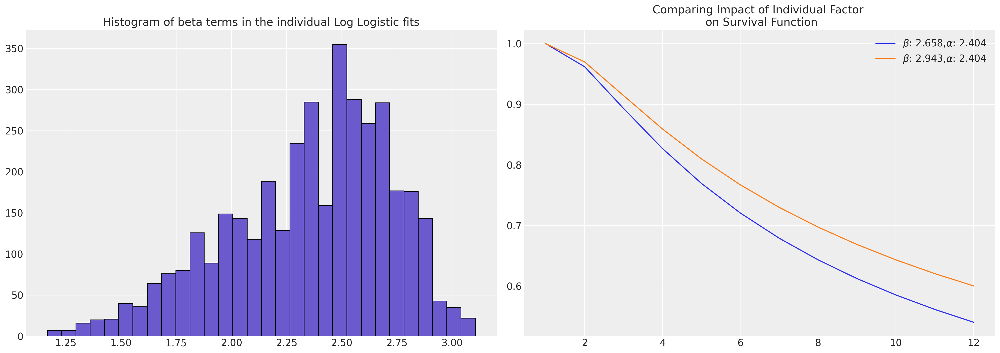

In [27]:
reg = az.summary(loglogistic_idata, var_names=["reg"])["mean"]
s = az.summary(loglogistic_idata, var_names=["s"])["mean"][0]
temp = retention_df
t = np.log(np.arange(1, 13, 1))
## Transforming to the Log-Logistic scale
alpha = np.round((1 / s), 3)
beta = np.round(np.exp(reg / alpha), 3)

fig, axs = plt.subplots(1, 2, figsize=(20, 7))
axs = axs.flatten()
axs[0].hist(reg, bins=30, ec="black", color="slateblue")
axs[0].set_title("Histogram of beta terms in the individual Log Logistic fits")
axs[1].plot(
    np.exp(t),
    fisk.sf(t, c=alpha, scale=beta.iloc[0]),
    label=r"$\beta$: " + f"{beta.iloc[0]}," + r"$\alpha$: " + f"{alpha}",
)
axs[1].plot(
    np.exp(t),
    fisk.sf(t, c=alpha, scale=beta.iloc[1000]),
    label=r"$\beta$: " + f"{beta.iloc[1000]}," + r"$\alpha$: " + f"{alpha}",
)
axs[1].set_title("Comparing Impact of Individual Factor \n on Survival Function")
axs[1].legend();

In [28]:
diff = reg.iloc[1000] - reg.iloc[0]
pchange = np.round(100 * (diff / reg.iloc[1000]), 2)
print(
    f"In this case we could think of the relative change in acceleration \n factor between the individuals as representing a {pchange}% increase"
)

In this case we could think of the relative change in acceleration 
 factor between the individuals as representing a 9.44% increase


In [29]:
loglogistic_predicted_surv = pd.DataFrame(
    [fisk.sf(t, c=alpha, scale=beta.iloc[i]) for i in range(len(reg))]
).T
loglogistic_predicted_surv

,0,1,2,3,4,5,6,7,8,9,...,3760,3761,3762,3763,3764,3765,3766,3767,3768,3769
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.961991,0.972250,0.950902,0.977471,0.939736,0.940788,0.967457,0.958955,0.936014,0.939485,...,0.959430,0.961925,0.916039,0.968926,0.969903,0.960809,0.975477,0.956343,0.961792,0.968165
2,0.893214,0.920502,0.864877,0.934806,0.837491,0.840024,0.907619,0.885339,0.828605,0.836887,...,0.886564,0.893041,0.782878,0.911545,0.914165,0.890136,0.929309,0.878634,0.892694,0.909508
3,0.827049,0.868761,0.785373,0.891275,0.746596,0.750123,0.848870,0.815305,0.734317,0.745757,...,0.817124,0.826790,0.673351,0.854893,0.858932,0.822444,0.882569,0.805404,0.826271,0.851763
4,0.769601,0.822189,0.718789,0.851325,0.672990,0.677099,0.796890,0.755111,0.658774,0.672014,...,0.757346,0.769280,0.590149,0.804507,0.809637,0.763902,0.839995,0.743000,0.768636,0.800544
5,0.720729,0.781302,0.663846,0.815635,0.613905,0.618336,0.751941,0.704345,0.598653,0.612855,...,0.706864,0.720364,0.526625,0.760738,0.766682,0.714270,0.802217,0.690752,0.719634,0.756156
6,0.679108,0.745520,0.618238,0.783917,0.565951,0.570547,0.713119,0.661429,0.550193,0.564863,...,0.664139,0.678713,0.477065,0.722786,0.729338,0.672124,0.768845,0.646852,0.677922,0.717747
7,0.643393,0.714085,0.579939,0.755671,0.526425,0.531093,0.679403,0.624834,0.510473,0.525321,...,0.627672,0.642978,0.437489,0.689711,0.696717,0.636049,0.739284,0.609611,0.642145,0.684334
8,0.612462,0.686296,0.547375,0.730397,0.493338,0.498021,0.649896,0.593311,0.477377,0.492230,...,0.596233,0.612032,0.405209,0.660678,0.668024,0.604872,0.712959,0.577673,0.611171,0.655050
9,0.585422,0.661562,0.519359,0.707659,0.465244,0.469908,0.623864,0.565882,0.449386,0.464142,...,0.568859,0.584983,0.378386,0.634999,0.642600,0.577668,0.689376,0.549990,0.584103,0.629183


Both models fit comparable estimates for these two individuals. We'll see now how the marginal survival function compares across our entire sample of indivduals. 

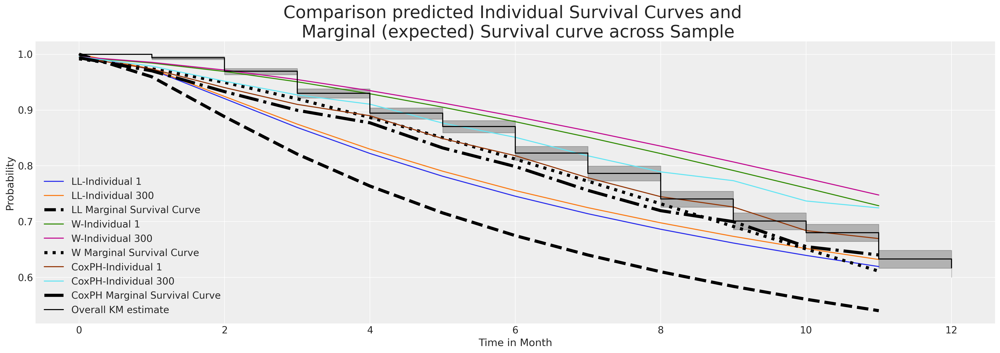

In [30]:
fig, ax = plt.subplots(figsize=(20, 7))
ax.plot(
    loglogistic_predicted_surv.iloc[:, [1, 300]], label=["LL-Individual 1", "LL-Individual 300"]
)
ax.plot(
    loglogistic_predicted_surv.mean(axis=1),
    label="LL Marginal Survival Curve",
    linestyle="--",
    color="black",
    linewidth=4.5,
)
ax.plot(weibull_predicted_surv.iloc[:, [1, 300]], label=["W-Individual 1", "W-Individual 300"])
ax.plot(
    weibull_predicted_surv.mean(axis=1),
    label="W Marginal Survival Curve",
    linestyle="dotted",
    color="black",
    linewidth=4.5,
)
ax.plot(surv_df.iloc[:, [1, 300]], label=["CoxPH-Individual 1", "CoxPH-Individual 300"])
ax.plot(
    surv_df.mean(axis=1),
    label="CoxPH Marginal Survival Curve",
    linestyle="-.",
    color="black",
    linewidth=4.5,
)
ax.set_title(
    "Comparison predicted Individual Survival Curves and \n Marginal (expected) Survival curve across Sample",
    fontsize=25,
)
kmf.plot_survival_function(ax=ax, label="Overall KM estimate", color="black")
ax.set_xlabel("Time in Month")
ax.set_ylabel("Probability")
ax.legend();

Above we've plotted a sample of individual predicted survival functions from each model. Additionally we've plotted the marginal survival curve predicted by averaging row-wise across the sample of individuals in our data set. This marginal quantity is often a useful benchmark for comparing change over differing periods. It is a measure that can be compared year on year and time over time. 

## Fit Model with Shared Frailty terms by Individual

One of the most compelling patterns in Bayesian regression modelling more generally is the ability to incorporate hierarchical structure. The analogue of the hierarchical survival model is the individual frailty survival model. But "frailities" do not need to be specified only at an individual level - so called "shared" frailities can be deployed at a group level e.g. across the `field`. 

In the above CoxPH models we fit the data to a standard regression formulation using indicator variables for different levels of the `field` variable which gets included in the weighted sum of the linear combination. With frailty models we instead allow the individual or group frailty term to enter into our model as a multiplicative factor over and above the combination of the baseline hazard with the weighted demographic characteristics of risk. This allows us to capture an estimate of the heterogenous effects accruing to being that particular individual or within that particular group. Additionally we can stratify baseline hazards e.g. for gender. So our equation now becomes:

$$ \lambda_{i}(t) = z_{i}exp(\beta X)\lambda_{0}^{g}(t) $$

which can be estimated in the Bayesian fashion as seen below. Note how we must set a prior on the $z$ term which enters the equation multiplicatively. To set such a prior we reason that the individual heterogeneity will not induce more than 30% speed-up/slow-down in time to attrition and we select a gamma distribution as a prior over our frailty term. 

In [31]:
opt_params = pm.find_constrained_prior(
    pm.Gamma,
    lower=0.80,
    upper=1.30,
    mass=0.90,
    init_guess={"alpha": 1.7, "beta": 1.7},
)

opt_params

/Users/nathanielforde/mambaforge/envs/pymc_examples_new/lib/python3.9/site-packages/pytensor/tensor/rewriting/elemwise.py:685: UserWarning: Optimization Warning: The Op gammainc_der does not provide a C implementation. As well as being potentially slow, this also disables loop fusion.
  warn(
/Users/nathanielforde/mambaforge/envs/pymc_examples_new/lib/python3.9/site-packages/pytensor/tensor/rewriting/elemwise.py:685: UserWarning: Optimization Warning: The Op gammainc_der does not provide a C implementation. As well as being potentially slow, this also disables loop fusion.
  warn(


{'alpha': 46.22819238464343, 'beta': 44.910852755302585}

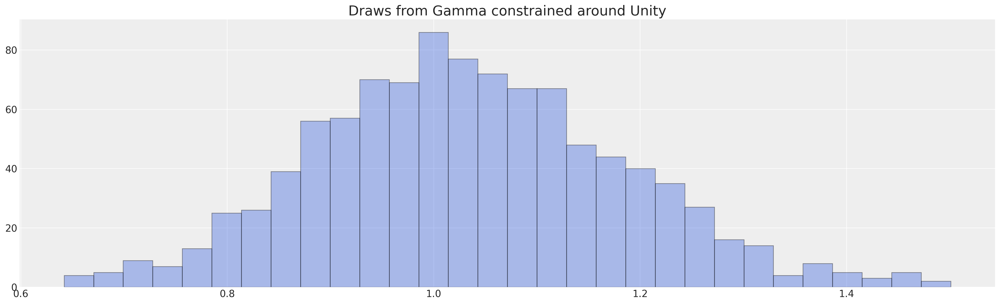

In [32]:
fig, ax = plt.subplots(figsize=(20, 6))
ax.hist(
    pm.draw(pm.Gamma.dist(alpha=opt_params["alpha"], beta=opt_params["beta"]), 1000),
    ec="black",
    color="royalblue",
    bins=30,
    alpha=0.4,
)
ax.set_title("Draws from Gamma constrained around Unity", fontsize=20);

Sampling: [beta, frailty, lambda0, mu_frailty, outcome, sigma_frailty]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [lambda0, sigma_frailty, mu_frailty, frailty, beta]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 158 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


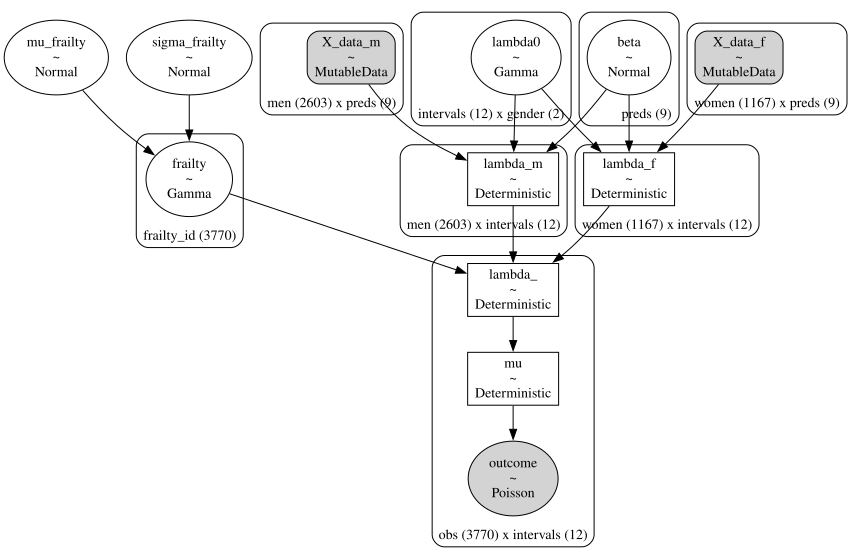

In [33]:
preds = [
    "sentiment",
    "intention",
    "Low",
    "Medium",
    "Finance",
    "Health",
    "Law",
    "Public/Government",
    "Sales/Marketing",
]
preds3 = ["sentiment", "Low", "Medium"]


def make_coxph_frailty(preds, factor):
    frailty_idx, frailty_labels = pd.factorize(factor)
    df_m = retention_df[retention_df["Male"] == 1]
    df_f = retention_df[retention_df["Male"] == 0]
    coords = {
        "intervals": intervals,
        "preds": preds,
        "frailty_id": frailty_labels,
        "gender": ["Male", "Female"],
        "women": df_f.index,
        "men": df_m.index,
        "obs": range(len(retention_df)),
    }

    with pm.Model(coords=coords) as frailty_model:
        X_data_m = pm.MutableData("X_data_m", df_m[preds], dims=("men", "preds"))
        X_data_f = pm.MutableData("X_data_f", df_f[preds], dims=("women", "preds"))
        lambda0 = pm.Gamma("lambda0", 0.01, 0.01, dims=("intervals", "gender"))
        sigma_frailty = pm.Normal("sigma_frailty", opt_params["alpha"], 1)
        mu_frailty = pm.Normal("mu_frailty", opt_params["beta"], 1)
        frailty = pm.Gamma("frailty", mu_frailty, sigma_frailty, dims="frailty_id")

        beta = pm.Normal("beta", 0, sigma=1, dims="preds")

        ## Stratified baseline hazards
        lambda_m = pm.Deterministic(
            "lambda_m",
            pt.outer(pt.exp(pm.math.dot(beta, X_data_m.T)), lambda0[:, 0]),
            dims=("men", "intervals"),
        )
        lambda_f = pm.Deterministic(
            "lambda_f",
            pt.outer(pt.exp(pm.math.dot(beta, X_data_f.T)), lambda0[:, 1]),
            dims=("women", "intervals"),
        )
        lambda_ = pm.Deterministic(
            "lambda_",
            frailty[frailty_idx, None] * pt.concatenate([lambda_f, lambda_m], axis=0),
            dims=("obs", "intervals"),
        )

        mu = pm.Deterministic("mu", exposure * lambda_, dims=("obs", "intervals"))

        obs = pm.Poisson("outcome", mu, observed=quit, dims=("obs", "intervals"))
        frailty_idata = pm.sample_prior_predictive()
        frailty_idata.extend(pm.sample(random_seed=101))

    return frailty_idata, frailty_model


frailty_idata, frailty_model = make_coxph_frailty(preds, range(len(retention_df)))
pm.model_to_graphviz(frailty_model)

which allows us to pull out the gender specific view on the baseline hazard. This kind of model specification can help account for failures of the proportional hazards assumption allowing for the expression of time-varying risk induced by different levels of the covariates. We can also allow for shared frailty terms across groups as here in the case of allowing group effect based on the `field` of work. Often however this is not too distinct from including the field as a fixed effect in your model as we did above in the first CoxPH model, but here we allow that the coefficient estimates are drawn from the same distribution. The variance characteristics of this distribution may be of independent interest.

In [34]:
shared_frailty_idata, shared_frailty_model = make_coxph_frailty(preds3, retention_df["field"])

Sampling: [beta, frailty, lambda0, mu_frailty, outcome, sigma_frailty]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [lambda0, sigma_frailty, mu_frailty, frailty, beta]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 70 seconds.


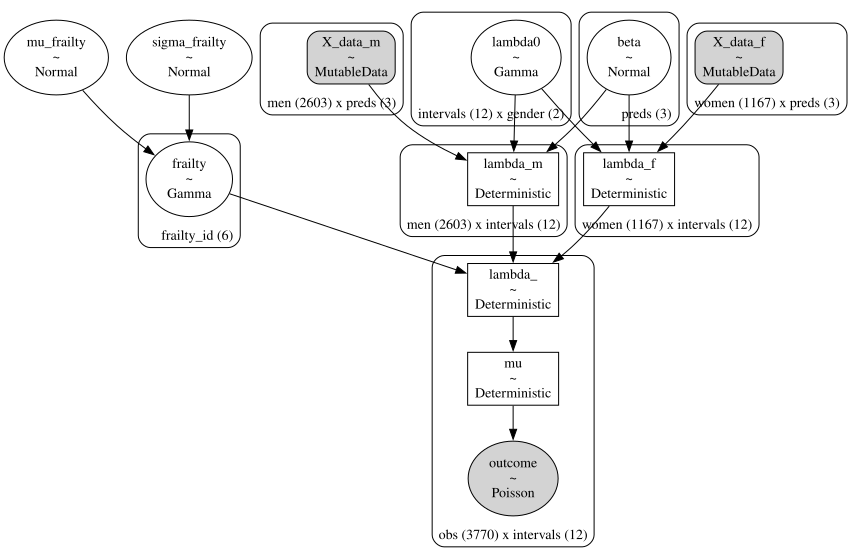

In [35]:
pm.model_to_graphviz(shared_frailty_model)

Additionally this allows us to see how the inclusion of more covariates and individual frailty term absorbs the variance in the baseline hazard and shrinks the magnitude of the latent hazard.

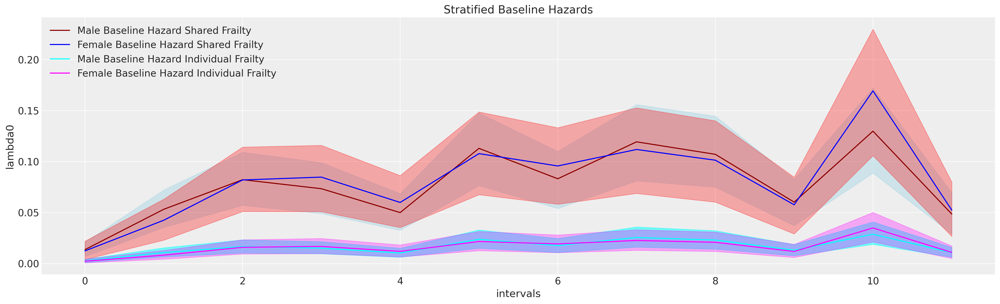

In [36]:
fig, ax = plt.subplots(figsize=(20, 6))
base_m = shared_frailty_idata["posterior"]["lambda0"].sel(gender="Male")
base_f = shared_frailty_idata["posterior"]["lambda0"].sel(gender="Female")
az.plot_hdi(range(12), base_m, ax=ax, color="lightblue", fill_kwargs={"alpha": 0.5}, smooth=False)
az.plot_hdi(range(12), base_f, ax=ax, color="red", fill_kwargs={"alpha": 0.3}, smooth=False)
get_mean(base_m).plot(ax=ax, color="darkred", label="Male Baseline Hazard Shared Frailty")
get_mean(base_f).plot(ax=ax, color="blue", label="Female Baseline Hazard Shared Frailty")

base_m_i = frailty_idata["posterior"]["lambda0"].sel(gender="Male")
base_f_i = frailty_idata["posterior"]["lambda0"].sel(gender="Female")
az.plot_hdi(range(12), base_m_i, ax=ax, color="cyan", fill_kwargs={"alpha": 0.5}, smooth=False)
az.plot_hdi(range(12), base_f_i, ax=ax, color="magenta", fill_kwargs={"alpha": 0.3}, smooth=False)
get_mean(base_m_i).plot(ax=ax, color="cyan", label="Male Baseline Hazard Individual Frailty")
get_mean(base_f_i).plot(ax=ax, color="magenta", label="Female Baseline Hazard Individual Frailty")


ax.legend()
ax.set_title("Stratified Baseline Hazards");

Let us to pull out and inspect the individual frailty terms:

In [37]:
frailty_terms = az.summary(frailty_idata, var_names=["frailty"])
frailty_terms.head()

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
frailty[0],0.959,0.146,0.678,1.223,0.003,0.002,2433.0,2325.0,1.0
frailty[1],0.984,0.152,0.692,1.255,0.003,0.002,2352.0,2273.0,1.0
frailty[2],0.980,0.145,0.699,1.243,0.003,0.002,3027.0,2771.0,1.0
frailty[3],0.963,0.143,0.705,1.247,0.003,0.002,2174.0,2785.0,1.0
frailty[4],0.953,0.141,0.687,1.217,0.004,0.003,1508.0,2561.0,1.0


and the shared terms across the groups. Where we can see how working in either Finance or Health seems to drive up the chances of attrition after controlling for other demographic information.

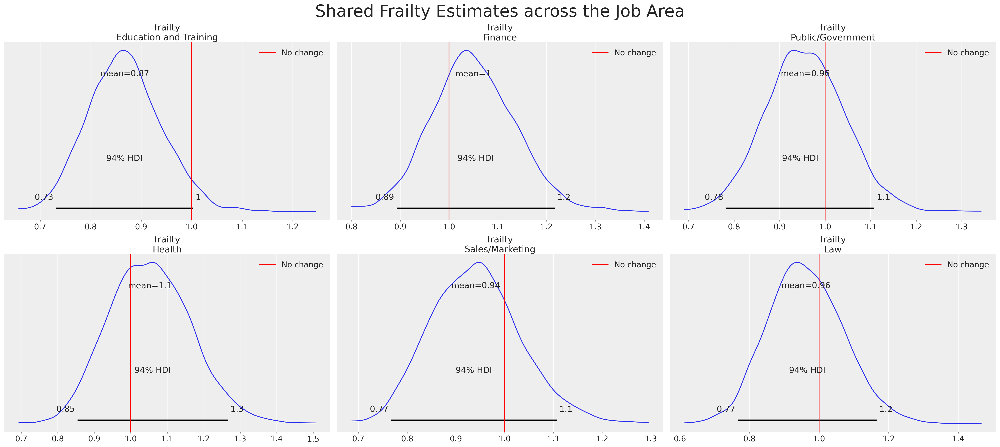

In [38]:
axs = az.plot_posterior(shared_frailty_idata, var_names=["frailty"])
axs = axs.flatten()
for ax in axs:
    ax.axvline(1, color="red", label="No change")
    ax.legend()
plt.suptitle("Shared Frailty Estimates across the Job Area", fontsize=30);

Shared frailty models such as this one are important in, for instance, medical trials where we want to measure the differences across institutions that are implementing a trial protocol. But similarly in the HR context we might imagine examining the the differential frailty terms across different manager/team dynamics. 

For now we'll leave that suggestion aside and focus on the individual frailty model.

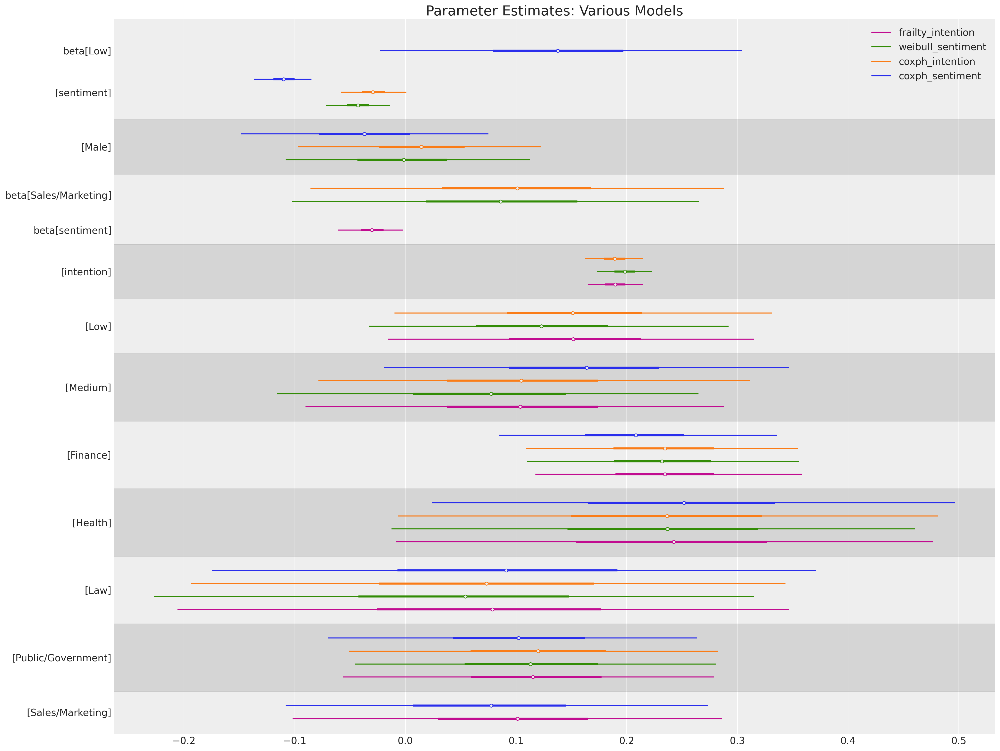

In [39]:
ax = az.plot_forest(
    [base_idata, base_intention_idata, weibull_idata, frailty_idata],
    model_names=["coxph_sentiment", "coxph_intention", "weibull_sentiment", "frailty_intention"],
    var_names=["beta"],
    combined=True,
    figsize=(20, 15),
)

ax[0].set_title("Parameter Estimates: Various Models", fontsize=20);

We can now pull apart the frailty estimates and compare them to the demographic information we know about each individual. Since we modelled the data without the intention variable it's interesting to see how the model tries to compensate for the impact of stated intention with the individual frailty term. 

In [40]:
temp = retention_df.copy()
temp["frailty"] = frailty_terms.reset_index()["mean"]
(
    temp.groupby(["Male", "sentiment", "intention"])[["frailty"]]
    .mean()
    .reset_index()
    .pivot(index=["Male", "sentiment"], columns="intention", values="frailty")
    .style.background_gradient(cmap="OrRd", axis=None)
    .set_precision(2)
)

/var/folders/__/ng_3_9pn1f11ftyml_qr69vh0000gn/T/ipykernel_42261/2371351940.py:4: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  temp.groupby(["Male", "sentiment", "intention"])[["frailty"]]


which suggests that the model over weights the impact of low sentiment and low intention score particularly and the frailty term compensates by adding a reduction in the rate of multiplicative increase in the hazard term. There is a general pattern that the model overweights the risk which is "corrected" downwards by the frailty terms. This makes a kind of sense as it's a little strange to see such low sentiment coupled with no intent to quit. Indicating that the respondent's answers might not reflect their considered opinion. The effect is similarly pronounced where intention to quit is higher, which also makes sense in this context too. 

## Interrogating the Cox Frailty Model

As before we'll want to pull out the individual predicted survival functions and cumulative hazard functions. This can be done similarly to the analysis above, but here we include the mean frailty term to predict the individual hazard. 


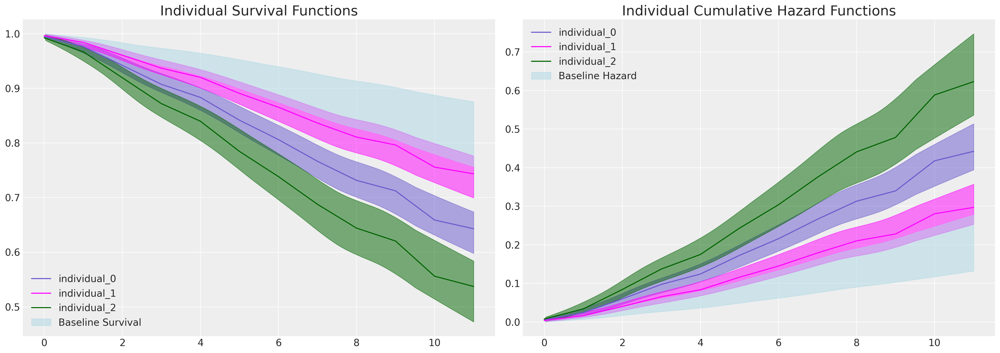

In [41]:
def extract_individual_frailty(i, retention_df, intention=False):
    beta = frailty_idata.posterior["beta"]
    if intention:
        intention_posterior = beta.sel(preds="intention")
    else:
        intention_posterior = 0
    hazard_base_m = frailty_idata["posterior"]["lambda0"].sel(gender="Male")
    hazard_base_f = frailty_idata["posterior"]["lambda0"].sel(gender="Female")
    frailty = frailty_idata.posterior["frailty"]
    if retention_df.iloc[i]["Male"] == 1:
        hazard_base = hazard_base_m
    else:
        hazard_base = hazard_base_f

    full_hazard_idata = hazard_base * (
        frailty.sel(frailty_id=i).mean().item()
        * np.exp(
            beta.sel(preds="sentiment") * retention_df.iloc[i]["sentiment"]
            + np.where(intention, intention_posterior * retention_df.iloc[i]["intention"], 0)
            + beta.sel(preds="Low") * retention_df.iloc[i]["Low"]
            + beta.sel(preds="Medium") * retention_df.iloc[i]["Medium"]
            + beta.sel(preds="Finance") * retention_df.iloc[i]["Finance"]
            + beta.sel(preds="Health") * retention_df.iloc[i]["Health"]
            + beta.sel(preds="Law") * retention_df.iloc[i]["Law"]
            + beta.sel(preds="Public/Government") * retention_df.iloc[i]["Public/Government"]
            + beta.sel(preds="Sales/Marketing") * retention_df.iloc[i]["Sales/Marketing"]
        )
    )

    cum_haz_idata = cum_hazard(full_hazard_idata)
    survival_idata = survival(full_hazard_idata)
    return full_hazard_idata, cum_haz_idata, survival_idata, hazard_base


def plot_individual_frailty(retention_df, individuals=[1, 300, 700], intention=False):
    fig, axs = plt.subplots(1, 2, figsize=(20, 7))
    axs = axs.flatten()
    colors = ["slateblue", "magenta", "darkgreen"]
    for i, c in zip(individuals, colors):
        haz_idata, cum_haz_idata, survival_idata, base_hazard = extract_individual_frailty(
            i, retention_df, intention
        )
        axs[0].plot(get_mean(survival_idata), label=f"individual_{i}", color=c)
        az.plot_hdi(range(12), survival_idata, ax=axs[0], fill_kwargs={"color": c})
        axs[1].plot(get_mean(cum_haz_idata), label=f"individual_{i}", color=c)
        az.plot_hdi(range(12), cum_haz_idata, ax=axs[1], fill_kwargs={"color": c})
        axs[0].set_title("Individual Survival Functions", fontsize=20)
        axs[1].set_title("Individual Cumulative Hazard Functions", fontsize=20)
    az.plot_hdi(
        range(12),
        survival(base_hazard),
        color="lightblue",
        ax=axs[0],
        fill_kwargs={"label": "Baseline Survival"},
    )
    az.plot_hdi(
        range(12),
        cum_hazard(base_hazard),
        color="lightblue",
        ax=axs[1],
        fill_kwargs={"label": "Baseline Hazard"},
    )
    axs[0].legend()
    axs[1].legend()


plot_individual_frailty(retention_df, [0, 1, 2], intention=True)

where we see a stark difference in the predicted survival functions for each individual explainted by the measure of their stated intention to leave:

In [42]:
retention_df.iloc[0:3, :]

,gender,field,level,sentiment,intention,left,month,Male,Low,Medium,Finance,Health,Law,Public/Government,Sales/Marketing
2997,F,Education and Training,Low,8,5,0,12,0,1,0,0,0,0,0,0
943,F,Education and Training,Medium,8,3,1,11,0,0,1,0,0,0,0,0
2548,F,Education and Training,Low,10,7,1,9,0,1,0,0,0,0,0,0


In [43]:
def create_predictions(retention_df, intention=False):
    cum_haz = {}
    surv = {}
    for i in range(len(retention_df)):
        haz_idata, cum_haz_idata, survival_idata, base_hazard = extract_individual_frailty(
            i, retention_df, intention
        )
        cum_haz[i] = get_mean(cum_haz_idata)
        surv[i] = get_mean(survival_idata)
    cum_haz = pd.DataFrame(cum_haz)
    surv = pd.DataFrame(surv)
    return cum_haz, surv


cum_haz_frailty_df, surv_frailty_df = create_predictions(retention_df, intention=True)
surv_frailty_df

,0,1,2,3,4,5,6,7,8,9,...,3760,3761,3762,3763,3764,3765,3766,3767,3768,3769
0,0.994606,0.996375,0.992411,0.997349,0.990543,0.990702,0.995489,0.994179,0.989593,0.991453,...,0.993628,0.994188,0.983980,0.995030,0.995925,0.993665,0.996433,0.994158,0.994063,0.995216
1,0.976327,0.984043,0.966826,0.988325,0.958788,0.959467,0.980174,0.974480,0.954712,0.962651,...,0.969320,0.971975,0.924277,0.976007,0.980310,0.969484,0.982735,0.971909,0.971377,0.976890
2,0.942033,0.960706,0.919347,0.971156,0.900424,0.902001,0.951311,0.937624,0.890904,0.909467,...,0.932821,0.938532,0.838909,0.947254,0.956586,0.933182,0.961883,0.938401,0.937252,0.949165
3,0.907312,0.936786,0.872011,0.953446,0.842969,0.845380,0.921911,0.900423,0.828493,0.856838,...,0.900804,0.909106,0.768149,0.921832,0.935513,0.901336,0.943293,0.908935,0.907248,0.924625
4,0.883317,0.920081,0.839730,0.941000,0.804224,0.807162,0.901485,0.874762,0.786641,0.821132,...,0.879373,0.889368,0.722899,0.904702,0.921262,0.880021,0.930687,0.889181,0.887128,0.908082
5,0.841648,0.890708,0.784532,0.918977,0.738834,0.742598,0.865795,0.830381,0.716478,0.760581,...,0.832603,0.846130,0.629919,0.866986,0.889720,0.833480,0.902695,0.845922,0.843086,0.871607
6,0.806120,0.865288,0.738349,0.899763,0.684982,0.689352,0.835135,0.792668,0.659146,0.710355,...,0.799519,0.815422,0.568818,0.840028,0.867017,0.800552,0.882474,0.815213,0.811833,0.845499
7,0.766357,0.836395,0.687650,0.877734,0.626822,0.631774,0.800555,0.750613,0.597743,0.655685,...,0.753924,0.772917,0.490788,0.802467,0.835171,0.755166,0.853987,0.772734,0.768621,0.809073
8,0.731486,0.810657,0.644064,0.857939,0.577659,0.583025,0.769986,0.713897,0.546274,0.609121,...,0.714991,0.736461,0.429643,0.769989,0.807437,0.716402,0.829057,0.736314,0.731583,0.777532
9,0.712245,0.796290,0.620376,0.846812,0.551281,0.556847,0.753018,0.693707,0.518844,0.584005,...,0.693743,0.716486,0.398343,0.752098,0.792068,0.695239,0.815195,0.716379,0.711309,0.760135


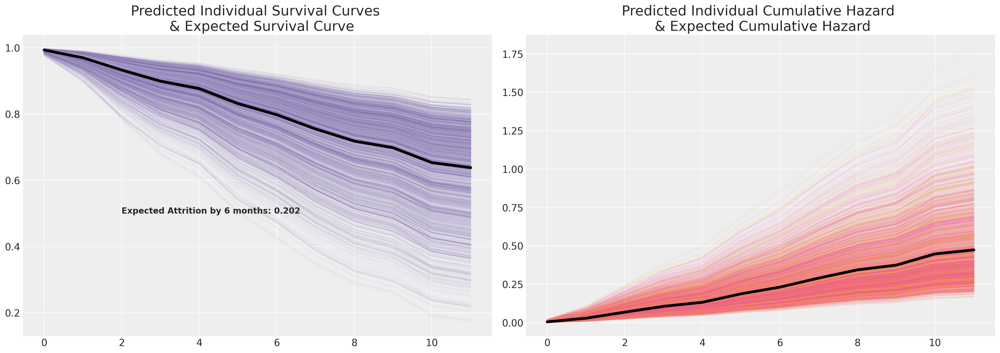

In [44]:
cm_subsection = np.linspace(0, 1, 120)
colors_m = [cm.Purples(x) for x in cm_subsection]
colors = [cm.spring(x) for x in cm_subsection]


fig, axs = plt.subplots(1, 2, figsize=(20, 7))
axs = axs.flatten()
cum_haz_frailty_df.plot(legend=False, color=colors, alpha=0.05, ax=axs[1])
axs[1].plot(cum_haz_frailty_df.mean(axis=1), color="black", linewidth=4)
axs[1].set_title(
    "Predicted Individual Cumulative Hazard \n & Expected Cumulative Hazard", fontsize=20
)

surv_frailty_df.plot(legend=False, color=colors_m, alpha=0.05, ax=axs[0])
axs[0].plot(surv_frailty_df.mean(axis=1), color="black", linewidth=4)
axs[0].set_title("Predicted Individual Survival Curves \n  & Expected Survival Curve", fontsize=20)
axs[0].annotate(
    f"Expected Attrition by 6 months: {np.round(1-surv_frailty_df.mean(axis=1).iloc[6], 3)}",
    (2, 0.5),
    fontsize=12,
    fontweight="bold",
);

### Plotting the effects of the Frailty Terms

There are different ways to marginalise across the data, but we can also inspect the individual "frailties". These kinds of plots and investigations are most fruitful in the context of an ongoing policy shift. Where you want to determine the differential rates of response for those individuals undergoing/experiencing the policy shift first-hand versus those who are not. It helps to zero-in on the most impacted employees or participants in the study to figure out what if anything was driving their response, and if preventative measures need to be adopted to resolve a crisis.

In [45]:
beta_individual_all = frailty_idata["posterior"]["frailty"]
predicted_all = beta_individual_all.mean(("chain", "draw"))
predicted_all = predicted_all.sortby(predicted_all, ascending=False)
beta_individual = beta_individual_all.sel(frailty_id=range(500))
predicted = beta_individual.mean(("chain", "draw"))
predicted = predicted.sortby(predicted, ascending=False)
ci_lb = beta_individual.quantile(0.025, ("chain", "draw")).sortby(predicted)
ci_ub = beta_individual.quantile(0.975, ("chain", "draw")).sortby(predicted)
hdi = az.hdi(beta_individual, hdi_prob=0.5).sortby(predicted)
hdi2 = az.hdi(beta_individual, hdi_prob=0.8).sortby(predicted)

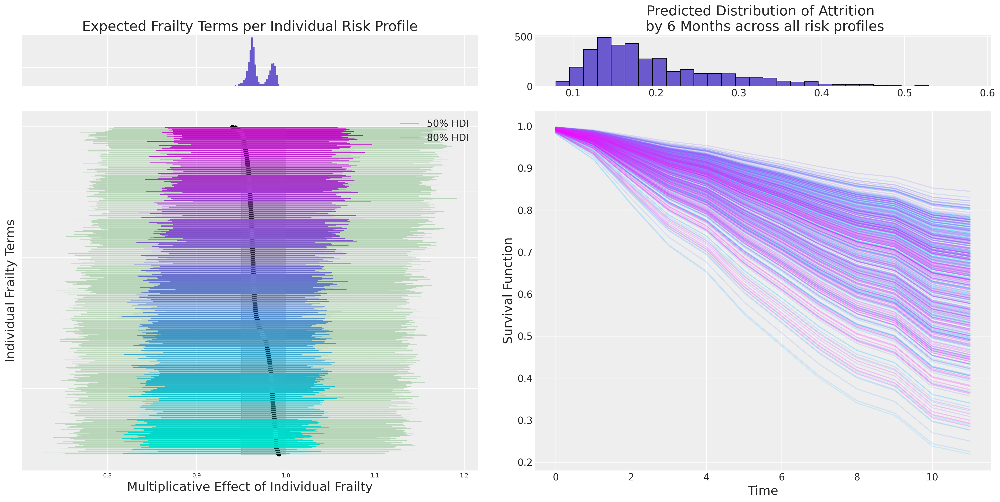

In [46]:
cm_subsection = np.linspace(0, 1, 500)
colors = [cm.cool(x) for x in cm_subsection]

fig = plt.figure(figsize=(20, 10))
gs = fig.add_gridspec(
    2,
    2,
    height_ratios=(1, 7),
    left=0.1,
    right=0.9,
    bottom=0.1,
    top=0.9,
    wspace=0.05,
    hspace=0.05,
)
# Create the Axes.
ax = fig.add_subplot(gs[1, 0])
ax.set_yticklabels([])
ax_histx = fig.add_subplot(gs[0, 0], sharex=ax)
ax_histx.set_title("Expected Frailty Terms per Individual Risk Profile", fontsize=20)
ax_histx.hist(predicted_all, bins=30, color="slateblue")
ax_histx.set_yticklabels([])
ax_histx.tick_params(labelsize=8)
ax.set_ylabel("Individual Frailty Terms", fontsize=18)
ax.tick_params(labelsize=8)
ax.hlines(
    range(len(predicted)),
    hdi.sel(hdi="lower").to_array(),
    hdi.sel(hdi="higher").to_array(),
    color=colors,
    label="50% HDI",
    linewidth=0.8,
)
ax.hlines(
    range(len(predicted)),
    hdi2.sel(hdi="lower").to_array(),
    hdi2.sel(hdi="higher").to_array(),
    color="green",
    alpha=0.2,
    label="80% HDI",
    linewidth=0.8,
)
ax.set_xlabel("Multiplicative Effect of Individual Frailty", fontsize=18)
ax.legend()
ax.fill_betweenx(range(len(predicted)), 0.95, 1.0, alpha=0.4, color="grey")

ax1 = fig.add_subplot(gs[1, 1])
surv_frailty_df[list(predicted["frailty_id"].values)].plot(
    ax=ax1, legend=False, color=colors, alpha=0.2
)
ax1_hist = fig.add_subplot(gs[0, 1])
ax1_hist.hist(
    (1 - surv_frailty_df[list(predicted_all["frailty_id"].values)].iloc[6]),
    bins=30,
    color="slateblue",
    ec="black",
)
ax1.set_xlabel("Time", fontsize=18)
ax1_hist.set_title(
    "Predicted Distribution of Attrition \n by 6 Months across all risk profiles", fontsize=20
)
ax1.set_ylabel("Survival Function", fontsize=18)
ax.scatter(predicted, range(len(predicted)), color="black", ec="black", s=30);

Here we see a plot of the individual frailty terms and the differential multiplicative effect they contribute to each individual's predicted hazard. This is a powerful lens on the question of how much the observed covariates capture for each individual and how much of a corrective adjustment is implied by the frailty terms?

## Conclusion

In this example we've seen how to model time-to-attrition in a employee lifecycle - we might also want to know how much time it will take to hire a replacement for the role! These applications of survival analysis can be applied routinely in industry wherever process efficiency is at issue. The better our understanding of risk over time, the better we can adapt to threats posed in heightened periods of risk. 

There are roughly two perspectives to be balanced: (i) the "actuarial" need to understand expected losses over the lifecycle, and (ii) the "diagnostic" needs to understand the causative factors that extend or reduce the lifecycle. Both are ultimately complementary as we need to "price in" differential flavours of risk that impact the expected bottom line whenever we plan for the future. Survival regression analysis neatly combines both these perspectives enabling the analyst to understand and take preventative action to offset periods of increased risk.

We've seen above a number of distinct regression modelling strategies for time-to-event data, but there are more flavours to explore: joint longitidunal models with a survival component, survival models with time-varying covariates, cure-rate models. The Bayesian perspective on these survival models is useful because we often have detailed results from prior years or experiments where our priors add useful perspective on the problem - allowing us to numerically encode that information to help regularise model fits for complex survival modelling. In the case of frailty models like the ones above - we've seen how priors can be added to the frailty terms to describe the influence of unobserved covariates which influence individual trajectories. Similarly the stratified approach to modelling baseline hazards allows us to carefully express trajectories of individual risk.  This can be especially important in the human centric disciplines where we seek to understand repeat measurments of the same individual time and again - accounting for the degree to which we can explain individual effects. Which is to say that while the framework of survival analysis suits a wide range of domains and problems, it nevertheless allows us to model, predict and infer aspects of specific and individual risk. 

## Authors
- Authored by [Nathaniel Forde](https://nathanielf.github.io/) in November 2023 

## References
:::{bibliography}
:filter: docname in docnames
:::

## Watermark

In [47]:
%load_ext watermark
%watermark -n -u -v -iv -w -p pytensor

Last updated: Sun Nov 19 2023

Python implementation: CPython
Python version       : 3.9.16
IPython version      : 8.11.0

pytensor: 2.11.1

matplotlib: 3.7.1
numpy     : 1.23.5
arviz     : 0.15.1
pymc      : 5.3.0
pytensor  : 2.11.1
pandas    : 1.5.3

Watermark: 2.3.1



:::{include} ../page_footer.md
:::